# Dependencies and files

## Install dependencies

## Imports

In [1]:
import warnings
import scanpy as sc
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

# Global variables

In [2]:
de_dir_path = './results/'

In [3]:
os.makedirs('figures/heatmaps', exist_ok=True)
os.makedirs('figures/snakeplots', exist_ok=True)

In [4]:
os.listdir(de_dir_path)

['anova_mamm_mean.csv',
 'cluster_spectr_anova_mean_6.csv',
 'cluster_spectr_anova_mean_7.csv',
 'cluster_spectr_anova_mean_8.csv',
 'cluster_spectr_anova_mean_9.csv',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'ttest_mamm_mean.csv']

In [5]:
layers = ['L1', 'L2', 'L3', 'L4', 'L5', "L6", 'WM']
cluster_color = ['red', 'blue', 'green',  'yellow', 'orange', 'purple', 'olive', 'pink', 'brown']
clusters_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

### DE results

In [6]:
anova_res = pd.read_csv(de_dir_path + 'anova_mamm_mean.csv', index_col=0)
anova_genes = anova_res[anova_res.p_val_adj < 0.05].index
anova_res.head()

,sum_sq,df,F,PR(>F),p_val_adj
A1BG,0.122578,12.0,2.796490,0.003701,0.010364
AAAS,0.017527,12.0,0.944161,0.509517,0.596369
AACS,0.136394,12.0,2.729393,0.004508,0.012212
AADAT,0.057031,12.0,5.478881,0.000002,0.000016
AAGAB,0.043359,12.0,2.127609,0.026045,0.053640


In [7]:
ttest_res = pd.read_csv(de_dir_path + 'ttest_mamm_mean.csv', index_col=0)
ttest_res.head()

,gene,layer,group1,group2,score,pvalue,p_val_adj
0,A1BG,L1,human,chimp,-1.790136,0.123630,0.345077
1,AACS,L1,human,chimp,0.363287,0.728846,0.861269
2,AADAT,L1,human,chimp,0.869717,0.417885,0.645979
3,AAK1,L1,human,chimp,-2.016288,0.090364,0.295232
4,AARS1,L1,human,chimp,-0.056056,0.957117,0.981898


## Load normalized pseudobulks

In [8]:
pb_dir_path = './results/'

In [9]:
os.listdir(pb_dir_path)

['anova_mamm_mean.csv',
 'cluster_spectr_anova_mean_6.csv',
 'cluster_spectr_anova_mean_7.csv',
 'cluster_spectr_anova_mean_8.csv',
 'cluster_spectr_anova_mean_9.csv',
 'pb_mammals_filtered.h5ad',
 'pb_mammals_samplenorm_mean.h5ad',
 'ttest_mamm_mean.csv']

In [10]:
adata_pb_norm = sc.read_h5ad(pb_dir_path + 'pb_mammals_samplenorm_mean.h5ad')
adata_pb_norm.var = anova_res
adata_pb_norm

AnnData object with n_obs × n_vars = 89 × 9208
    obs: 'layer', 'sample_id', 'psbulk_n_cells', 'psbulk_counts', 'condition', 'lib_size', 'log_lib_size'
    var: 'sum_sq', 'df', 'F', 'PR(>F)', 'p_val_adj'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'psbulk_props'

# Visualisation

## PCA

In [11]:
adata_norm_anova = adata_pb_norm[:, adata_pb_norm.var.p_val_adj < 0.05]
df = pd.DataFrame(adata_norm_anova.X, columns=adata_norm_anova.var_names, index=adata_norm_anova.obs_names)
df.head()

,A1BG,AACS,AADAT,AAK1,AARS1,AATK,ABAT,ABCA2,ABCA3,ABCA5,...,ZNF771,ZNF791,ZNF92,ZNFX1,ZNRF3,ZSWIM5,ZSWIM6,ZWILCH,ZYG11B,ZYX
chimp_11454_L1,0.005079,-0.108424,0.013291,-0.069955,0.002562,-0.047274,0.080485,-0.001263,0.005546,-0.100004,...,0.092490,0.119454,-0.007902,0.177926,-0.012706,0.047432,-0.010286,0.028279,-0.013137,0.022066
chimp_13309_L1,-0.014054,-0.004051,-0.002748,0.055413,0.014893,-0.035207,-0.030835,-0.000636,0.012722,0.012190,...,0.156169,-0.012133,-0.004915,-0.053168,0.058397,0.000000,0.024417,-0.016176,-0.005356,-0.000944
chimp_j8_L1,0.009907,-0.088813,0.001865,-0.002917,0.029188,-0.010154,-0.067142,-0.000510,-0.010249,-0.120019,...,0.063283,0.075654,0.016909,0.009687,0.015233,0.000000,-0.001553,-0.003124,-0.003501,-0.004307
human_759_L1,-0.142812,-0.068295,0.029625,-0.167612,-0.043530,-0.042047,0.103104,-0.051013,-0.051488,0.038154,...,-0.002273,-0.029408,0.007854,-0.022676,0.268809,0.008330,0.024852,-0.084963,-0.053720,0.083597
human_j12_L1,-0.018240,-0.116677,-0.055486,-0.126356,-0.054107,-0.069466,0.038200,-0.113067,-0.053844,-0.028488,...,-0.035837,0.002423,0.006162,0.028334,0.171663,-0.047386,-0.023089,-0.132802,-0.138752,0.050423


In [12]:
human_specific_genes = ttest_res[(ttest_res.group1 == 'human') & (ttest_res.p_val_adj < 0.05)].gene.unique().tolist()
df_hs = df[human_specific_genes].copy()
df_hs.head()

,ABI2,ACTG1,ADAM15,ADCY1,ALCAM,ARID5A,ASNS,BASP1,BPTF,BRINP3,...,TTC17,TUBA8,UBE3C,UMPS,UQCRC1,VAT1,WNK1,YARS1,ZDHHC9,ZNF304
chimp_11454_L1,-0.062925,-0.008724,0.122302,0.000000,0.031870,0.090740,0.014038,0.019236,0.079765,0.002858,...,-0.064966,-0.005742,-0.115916,0.014871,-0.023975,0.106309,0.074330,-0.203579,0.093326,-0.023245
chimp_13309_L1,-0.054608,0.000342,0.127441,0.000000,0.007906,0.050275,0.000000,0.050092,0.031390,-0.014054,...,-0.006827,0.000000,-0.015673,-0.019670,-0.192095,0.038903,0.040738,-0.147002,-0.084543,-0.000477
chimp_j8_L1,-0.061781,-0.030488,0.110999,0.000000,-0.012385,0.072508,-0.000716,-0.015483,-0.005786,-0.007348,...,-0.007194,-0.001043,0.006688,-0.016655,-0.011547,0.049030,0.186848,-0.041688,-0.056892,0.080850
human_759_L1,-0.126493,-0.087195,0.031095,-0.380575,-0.178383,0.005458,-0.119376,-0.412767,0.377054,-0.152192,...,0.012028,0.015624,-0.073132,0.057505,-0.139340,-0.110687,0.066052,-0.051509,-0.026566,-0.008473
human_j12_L1,-0.158336,-0.112776,-0.030323,-0.558881,-0.232660,-0.024510,-0.140692,-0.334470,0.464949,-0.182130,...,-0.019236,0.038333,-0.116095,-0.007775,-0.135054,-0.060468,0.077303,-0.159516,-0.102165,0.058322


In [13]:
sample_order = dict()
for cond in ['human', 'chimp', 'macaque']:
    samples = df.loc[df.index.str.contains(cond)].index
    order = sorted(samples.tolist(), key=lambda x: x[-2:])
    order_laminar = list(filter(lambda x: 'L' in x, order))
    order_wm = list(filter(lambda x: 'WM' in x, order))
    sample_order[cond] = order_wm + order_laminar
sample_order['all'] = sample_order['human'] + sample_order['chimp'] + sample_order['macaque']
df = df.loc[sample_order['all']]
df_hs = df_hs.loc[sample_order['all']]

In [14]:
#import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(adata_pb_norm.X.T)

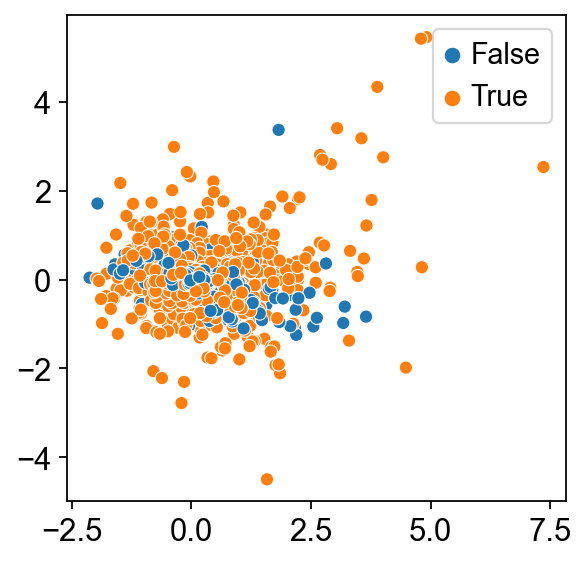

In [15]:
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=(adata_pb_norm.var.p_val_adj < 0.05).values)
plt.grid(False)

# Clusterization of all genes

## Hierarchal clustering

In [16]:
df_all = pd.DataFrame(adata_pb_norm.X, columns=adata_pb_norm.var_names, index=adata_pb_norm.obs_names)
df_all = df_all.loc[sample_order['all']]
df_all.head()

,A1BG,AAAS,AACS,AADAT,AAGAB,AAK1,AAMDC,AAMP,AAR2,AARS1,...,ZSWIM5,ZSWIM6,ZSWIM7,ZSWIM8,ZUP1,ZWILCH,ZYG11B,ZYX,ZZEF1,ZZZ3
human_759_WM,-0.065495,0.010434,0.041268,-0.054351,0.025707,-0.072019,-0.019207,0.051644,-0.040637,0.007453,...,0.036042,-0.025797,0.009901,0.071362,-0.083505,0.041762,-0.026634,-0.087689,-0.063893,-0.040384
human_j12_WM,-0.060239,0.019742,0.025153,-0.066483,-0.044543,0.001885,0.120468,0.044115,-0.005605,0.064853,...,0.008039,-0.011982,-0.000140,0.013841,-0.005179,-0.051615,-0.144635,-0.030077,-0.016105,0.055280
human_j3_WM,-0.095841,0.030377,-0.028083,-0.100378,-0.011412,0.121080,0.096006,-0.036493,-0.043526,-0.017252,...,-0.025040,0.025672,-0.022279,-0.063037,0.055279,-0.082378,-0.050937,-0.060124,-0.077665,0.020677
human_j4_WM,-0.091943,0.057763,-0.020194,-0.100982,-0.054054,0.040012,0.081541,-0.023853,0.081220,0.055494,...,-0.031159,-0.014967,-0.042334,0.014476,0.012403,-0.117408,-0.020468,-0.110733,-0.023327,0.078987
human_j6_WM,-0.078252,-0.015277,0.004524,-0.134850,0.010688,0.078731,-0.073053,0.049893,-0.014778,-0.074468,...,0.052648,-0.099636,0.030391,-0.021561,0.130150,-0.005066,0.020878,-0.112694,-0.059420,0.027191


D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


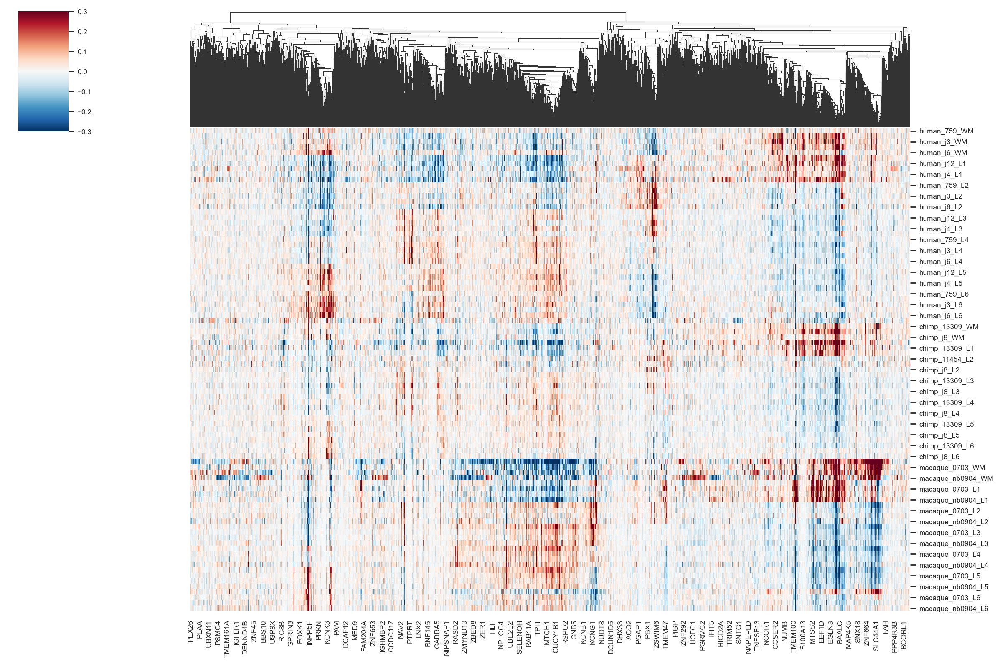

In [17]:
sns.set(font_scale=0.7)
sns.clustermap(df_all, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.3, vmin=-0.3, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('figures/heatmaps/clustermap_anova.png')

## Spectral clustering

### 7 clusters

#### Clustering

In [18]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df_all.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [19]:
#cl_order = {i: a for i, a in enumerate([1, 4, 3, 2, 0, 5])}
labels = pd.Series(clustering.labels_, index=df_all.columns).sort_values()
order = labels.sort_values().index
#labels.to_csv(de_dir_path + f'cluster_spectr_anova_{n_clusters}.csv')

#### Heatmap

<Axes: >

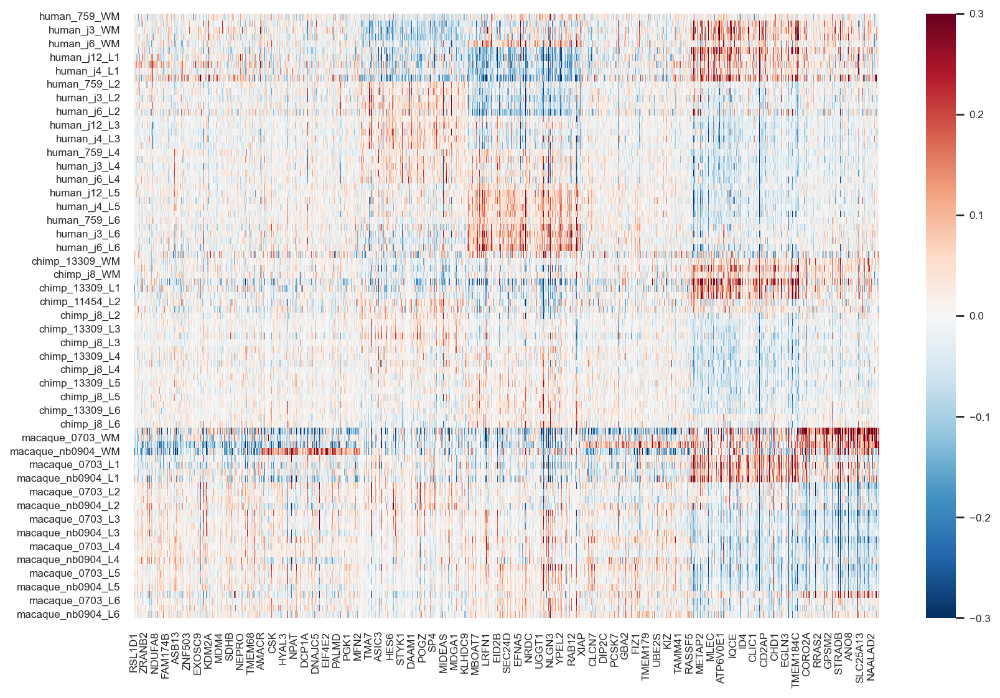

In [20]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df_all.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
#plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Snakeplot for each layer

In [21]:
df_annotation = df_all.copy()
df_annotation['layer'] = adata_pb_norm.obs.layer
df_annotation['condition'] = adata_pb_norm.obs.condition

In [22]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AAAS      AACS     AADAT     AAGAB      AAK1  \
condition layer                                                               
chimp     L1     0.000311  0.022240 -0.067096  0.004136  0.006259 -0.005820   
          L2    -0.025557 -0.011629 -0.121551 -0.001924  0.009986 -0.014660   
          L3     0.076603 -0.015677 -0.020433  0.028048  0.006021 -0.007055   
          L4     0.062482  0.018768  0.042894  0.007185  0.013482 -0.018464   
          L5    -0.010620 -0.016573  0.077460 -0.009728 -0.012463 -0.007488   

                    AAMDC      AAMP      AAR2     AARS1  ...    ZSWIM5  \
condition layer                                          ...             
chimp     L1     0.031259  0.010712  0.019617  0.015548  ...  0.015811   
          L2    -0.024830 -0.007021  0.020408 -0.027253  ... -0.002635   
          L3    -0.009535 -0.020843 -0.009666 -0.005945  ... -0.002672   
          L4     0.000866  0.018736  0.018289 -0.009535  ... -0.002672   
          L5    -0.007860  0.018095 -0.016876 -0.010588  ... -0.000386   

                   ZSWIM6    ZSWIM7    ZSWIM8      ZUP1    ZWILCH    ZYG11B  \
condition layer                                                               
chimp     L1     0.004193 -0.044921 -0.016086 -0.101012  0.002993 -0.007331   
          L2    -0.006481  0.093601  0.046118  0.026112  0.003258  0.005846   
          L3    -0.001571 -0.013281  0.005516  0.004399 -0.002625 -0.000610   
          L4    -0.005166 -0.009858 -0.008125  0.003925  0.004127  0.001754   
          L5    -0.001691 -0.043626  0.002484  0.015830 -0.012560 -0.001946   

                      ZYX     ZZEF1      ZZZ3  
condition layer                                
chimp     L1     0.005605 -0.036471  0.012691  
          L2    -0.003745  0.016427  0.025918  
          L3     0.003216 -0.007998 -0.017862  
          L4     0.003341 -0.013224 -0.037157  
          L5    -0.002624 -0.006421 -0.014971  

[5 rows x 9208 columns]

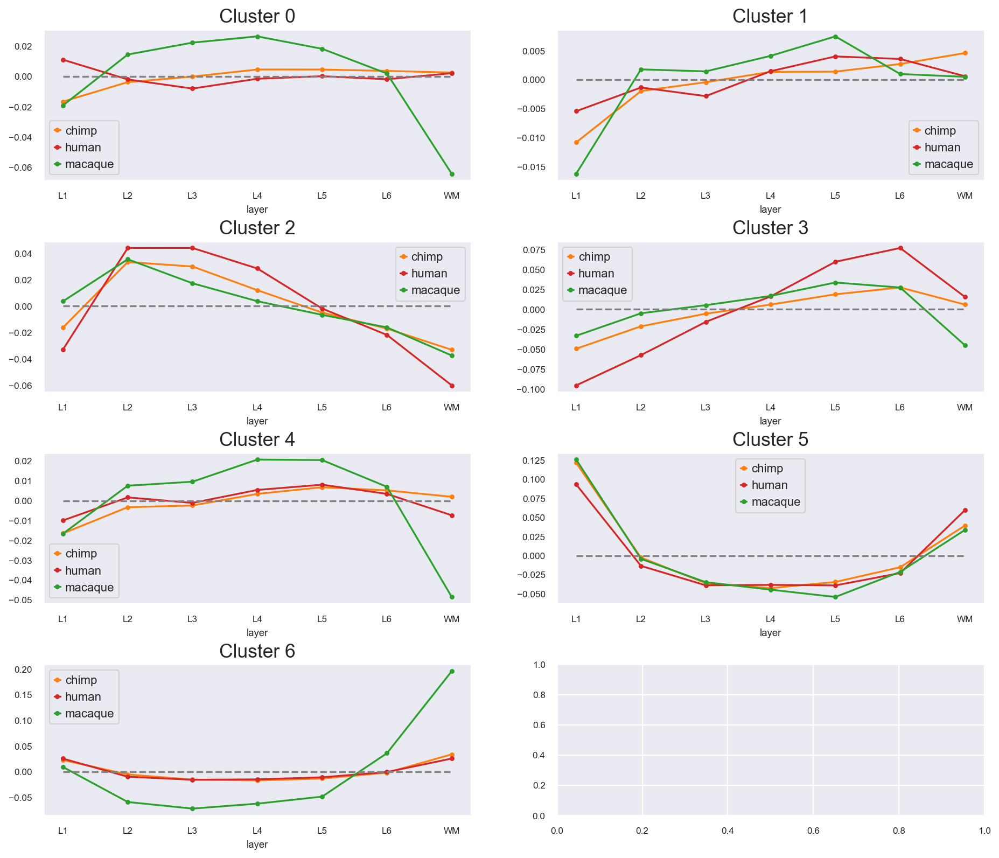

In [23]:
fig, axes = plt.subplots(n_clusters // 2 + 1, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

clusters = np.arange(n_clusters)
for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
#plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

# Clusterisation of the ANOVA significant genes

## Hierarchal clustering

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


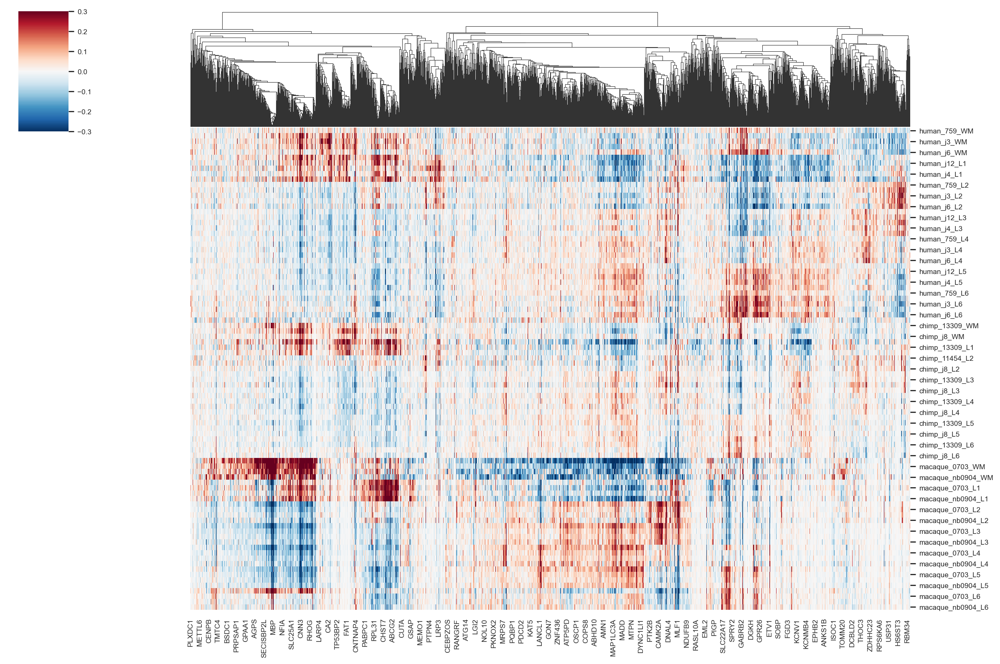

In [24]:
sns.set(font_scale=0.7)
sns.clustermap(df, figsize=(15, 10), cmap="RdBu_r", center=0, vmax=0.3, vmin=-0.3, metric='cosine', annot_kws={"size": 2}, row_cluster=False).savefig('figures/heatmaps/clustermap_anova.png')

Clusterization for each layer

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\l

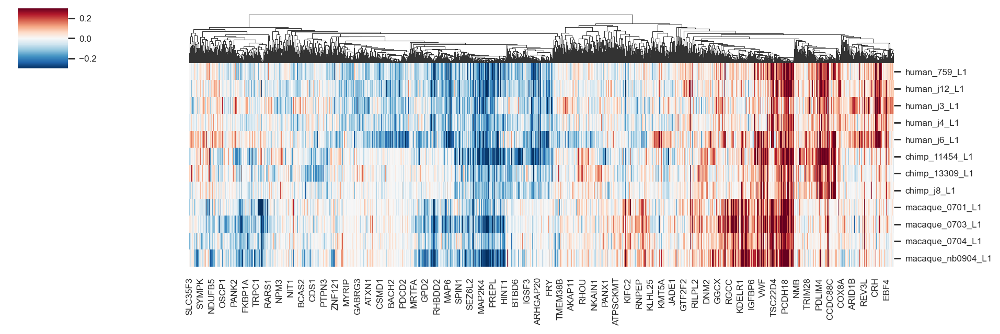

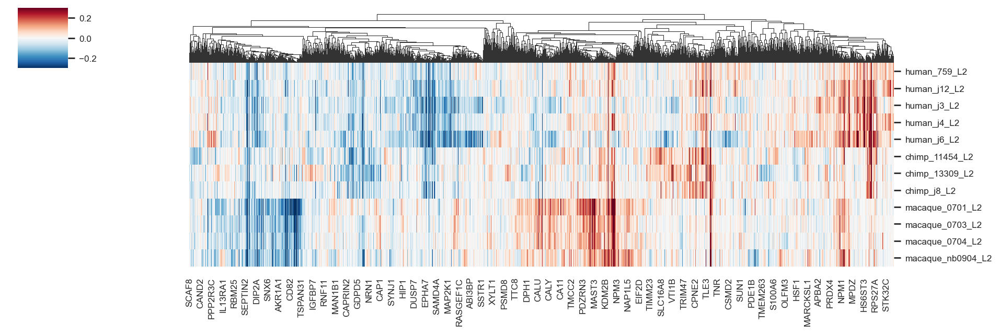

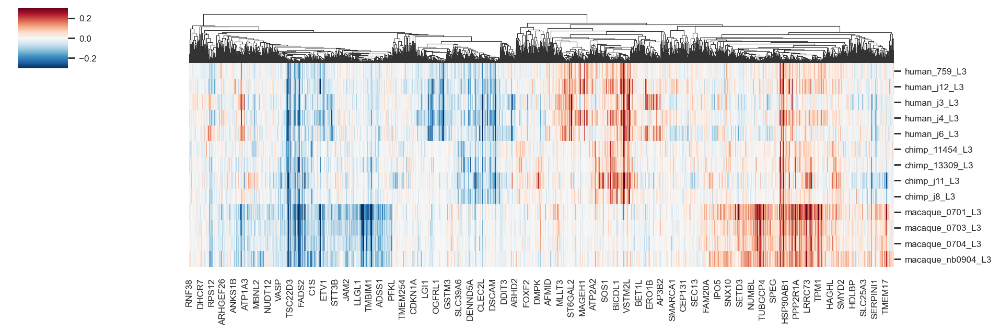

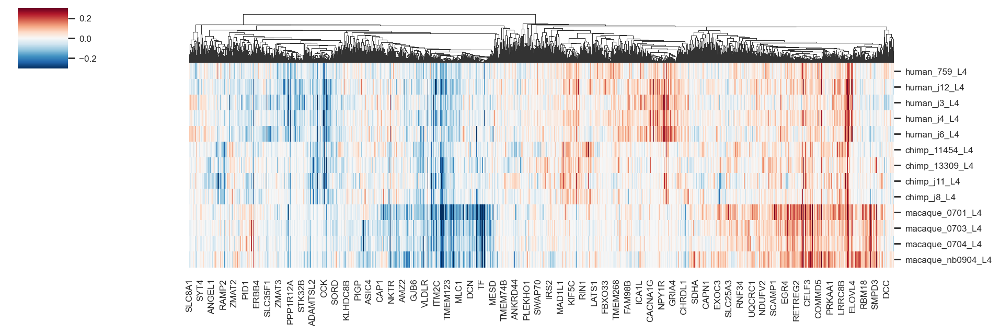

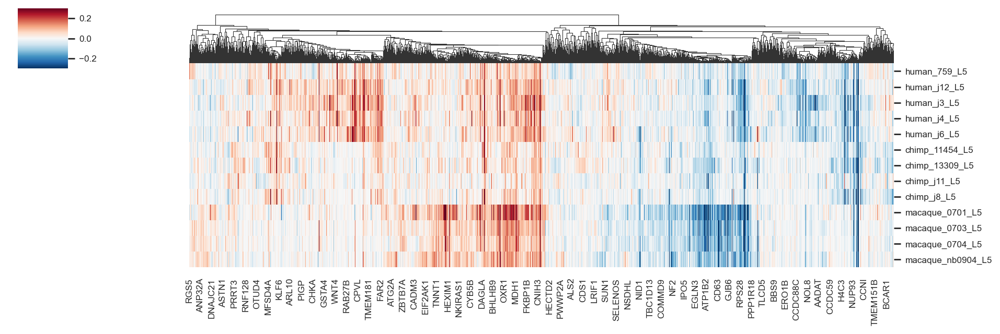

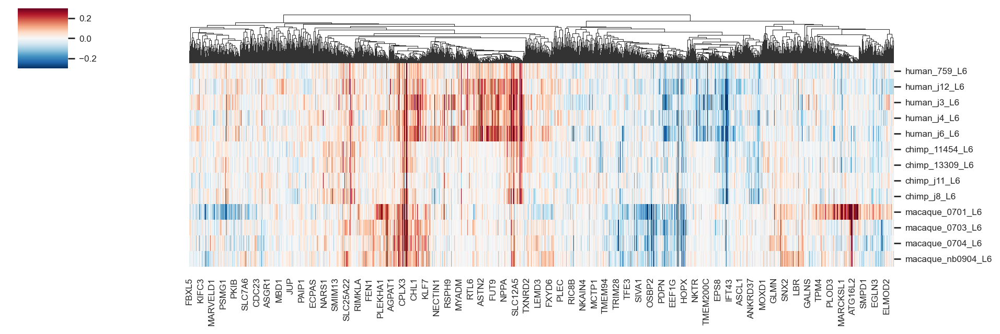

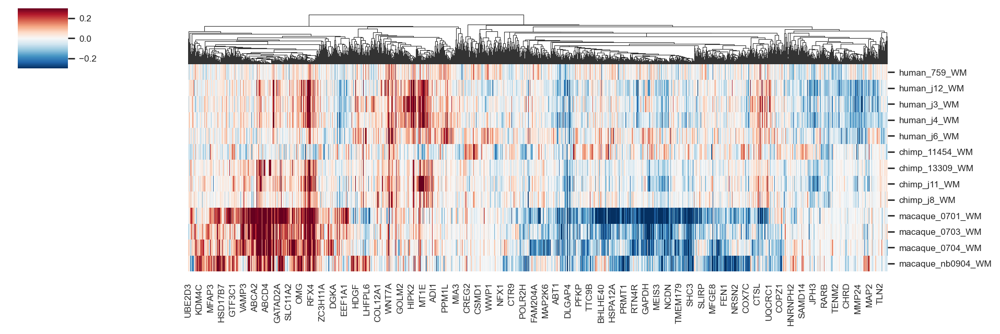

In [25]:
for layer in ['L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'WM']:
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.clustermap(df_layer, figsize=(12, 4), cmap="RdBu_r", center=0,
                   vmax=0.3, vmin=-0.3, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

Clusterisation for each specie

D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
D:\Projects\spatialMPFC\venv\lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


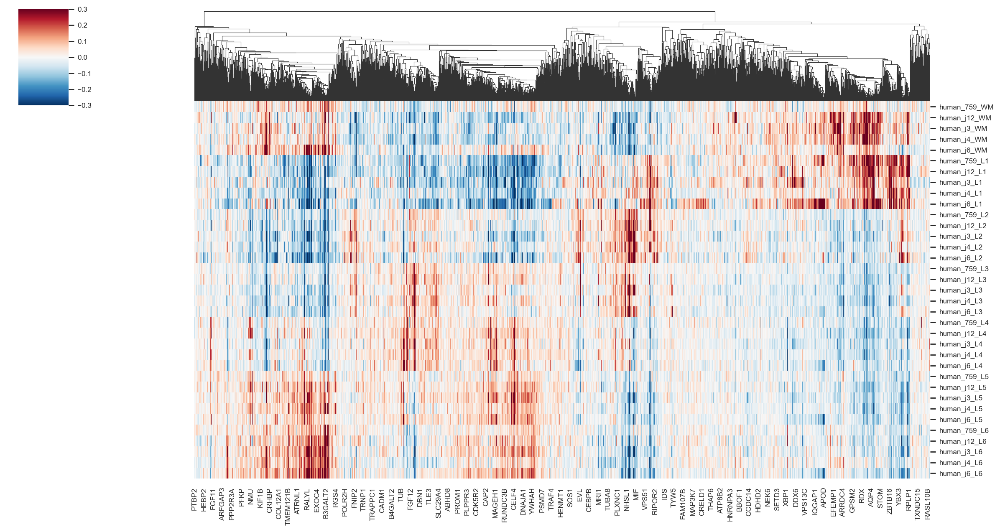

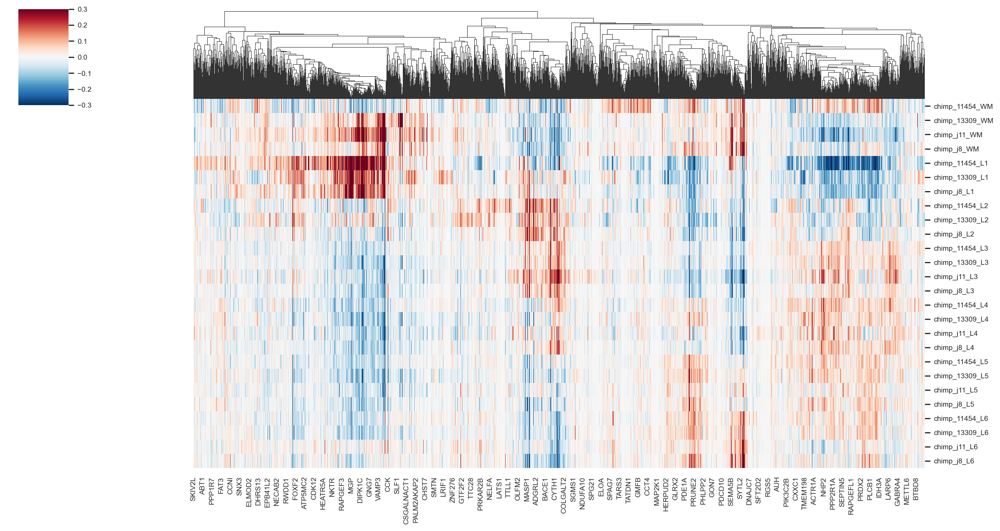

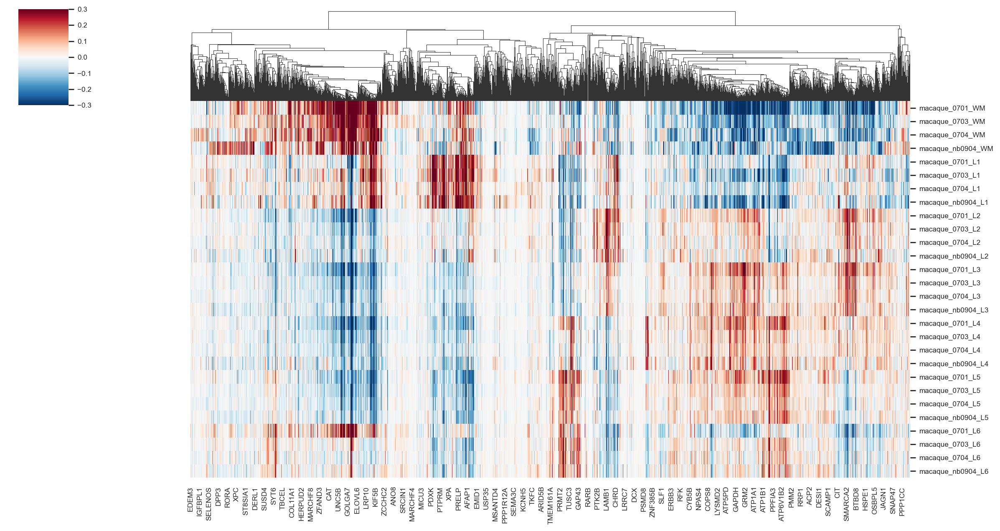

In [26]:
for cond in ['human', 'chimp', 'macaque']:
    df_cond = df.loc[df.index.str.contains(cond)]
    max_val = df_cond.max(axis=0).sort_values()
    df_cond = df_cond[max_val[max_val > 0].index.tolist()]
    sns.clustermap(df_cond, figsize=(15, 8), cmap="RdBu_r", center=0,
                   vmax=0.3, vmin=-0.3, metric='cosine',
                   annot_kws={"size": 2}, row_cluster=False)

## Spectral clustering

### 6 clusters

#### Clustering

In [27]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 6
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=6,
                   random_state=4)

In [28]:
cl_order = {i: a for i, a in enumerate([1, 4, 3, 2, 0, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv')

#### Heatmap

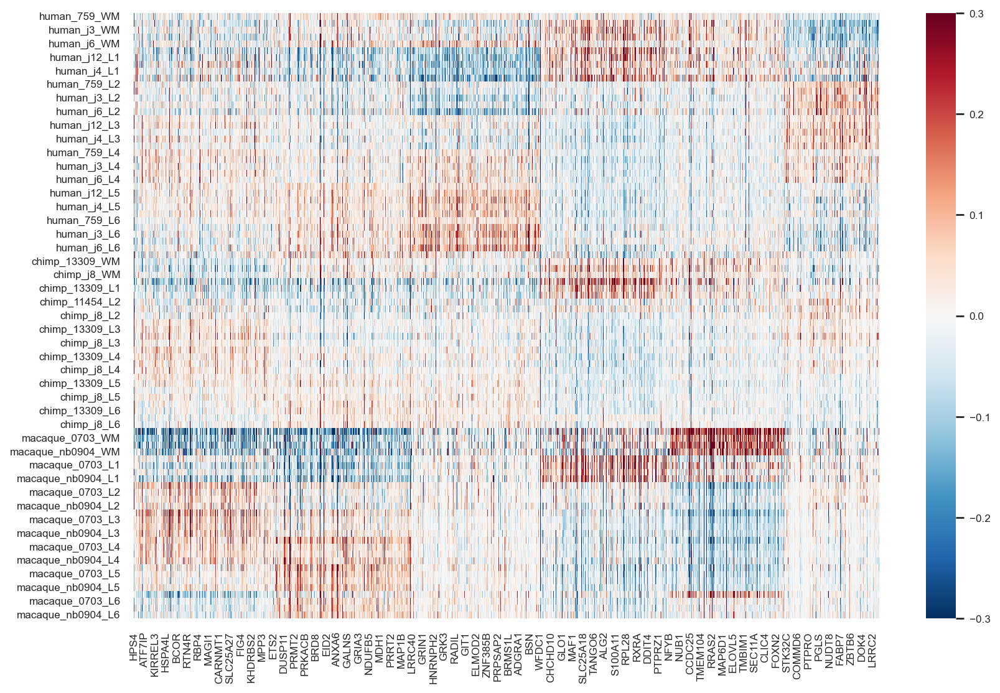

In [29]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

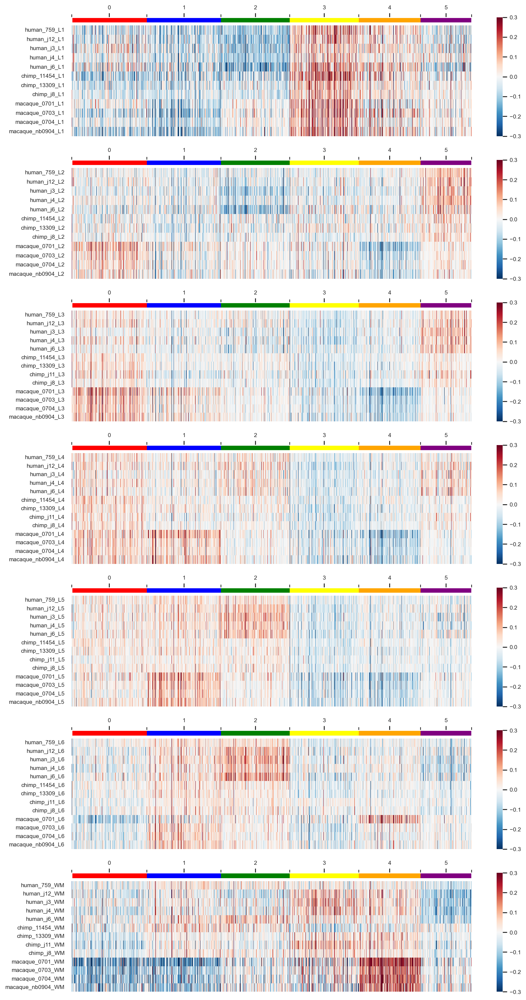

In [30]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

In [31]:
df_annotation = df.copy()
df_annotation['layer'] = adata_norm_anova.obs.layer
df_annotation['condition'] = adata_norm_anova.obs.condition

In [32]:
layer_mean = df_annotation.groupby(['condition', 'layer']).mean()
layer_mean.head()

A1BG      AACS     AADAT      AAK1     AARS1      AATK  \
condition layer                                                               
chimp     L1     0.000311 -0.067096  0.004136 -0.005820  0.015548 -0.030878   
          L2    -0.025557 -0.121551 -0.001924 -0.014660 -0.027253 -0.065565   
          L3     0.076603 -0.020433  0.028048 -0.007055 -0.005945 -0.000613   
          L4     0.062482  0.042894  0.007185 -0.018464 -0.009535  0.005079   
          L5    -0.010620  0.077460 -0.009728 -0.007488 -0.010588  0.047233   

                     ABAT     ABCA2     ABCA3     ABCA5  ...    ZNF771  \
condition layer                                          ...             
chimp     L1    -0.005831 -0.000803  0.002673 -0.069278  ...  0.103981   
          L2    -0.089762 -0.000803 -0.019373  0.024794  ... -0.042995   
          L3    -0.051850  0.003244 -0.005012  0.033964  ...  0.032819   
          L4     0.036816 -0.001952 -0.002816  0.011740  ... -0.024613   
          L5     0.086123 -0.001801 -0.002795 -0.010684  ... -0.023965   

                   ZNF791     ZNF92     ZNFX1     ZNRF3    ZSWIM5    ZSWIM6  \
condition layer                                                               
chimp     L1     0.060992  0.001364  0.044815  0.020308  0.015811  0.004193   
          L2    -0.006265  0.004805  0.007011 -0.019569 -0.002635 -0.006481   
          L3     0.006503 -0.001562 -0.014307 -0.014304 -0.002672 -0.001571   
          L4    -0.034777 -0.006946 -0.015902 -0.002362 -0.002672 -0.005166   
          L5    -0.015340 -0.008374 -0.023455 -0.019414 -0.000386 -0.001691   

                   ZWILCH    ZYG11B       ZYX  
condition layer                                
chimp     L1     0.002993 -0.007331  0.005605  
          L2     0.003258  0.005846 -0.003745  
          L3    -0.002625 -0.000610  0.003216  
          L4     0.004127  0.001754  0.003341  
          L5    -0.012560 -0.001946 -0.002624  

[5 rows x 4387 columns]

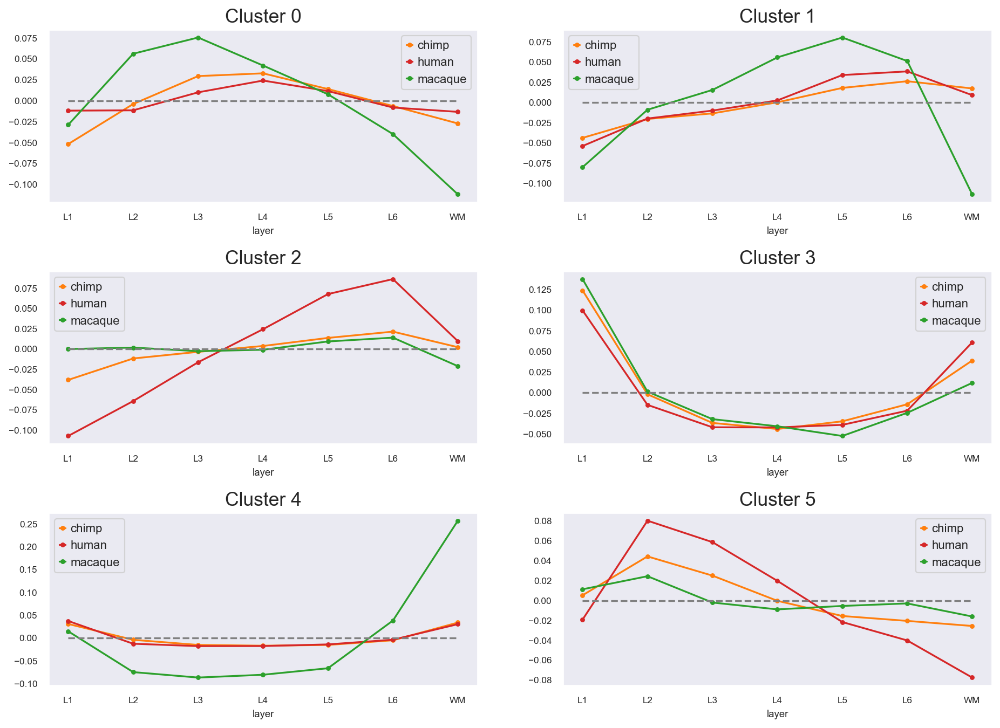

In [33]:
fig, axes = plt.subplots(n_clusters // 2, 2,  figsize=(14, 3.5 * n_clusters // 2), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 7 clusters

#### Clustering

In [34]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 7
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=7,
                   random_state=4)

In [35]:
cl_order = {i: a for i, a in enumerate([3, 1, 4, 0, 2, 6, 5])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv')

#### Heatmap

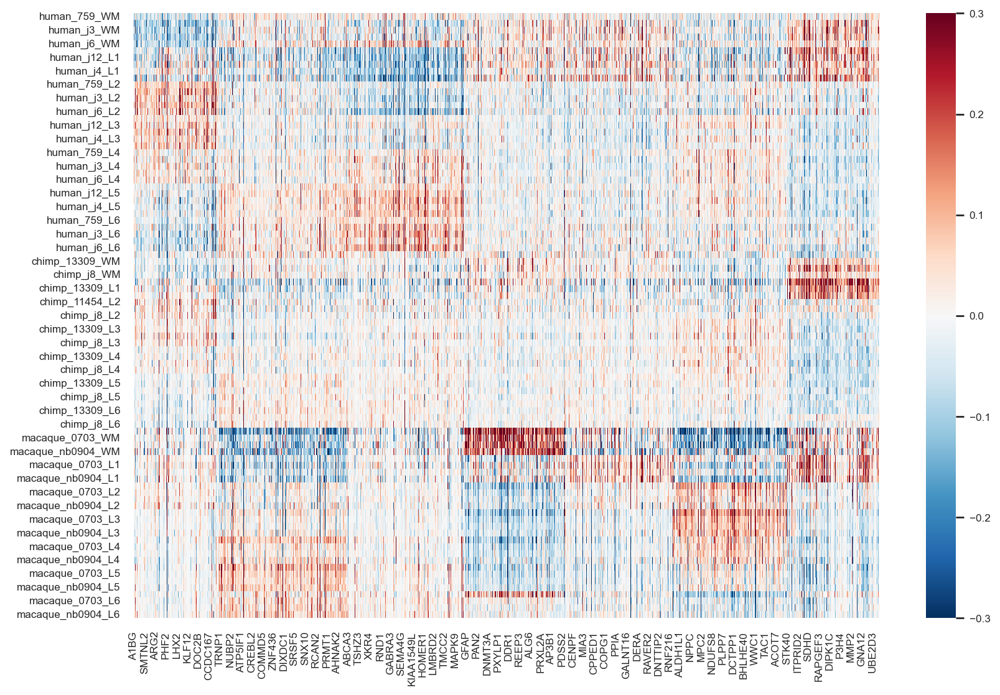

In [36]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

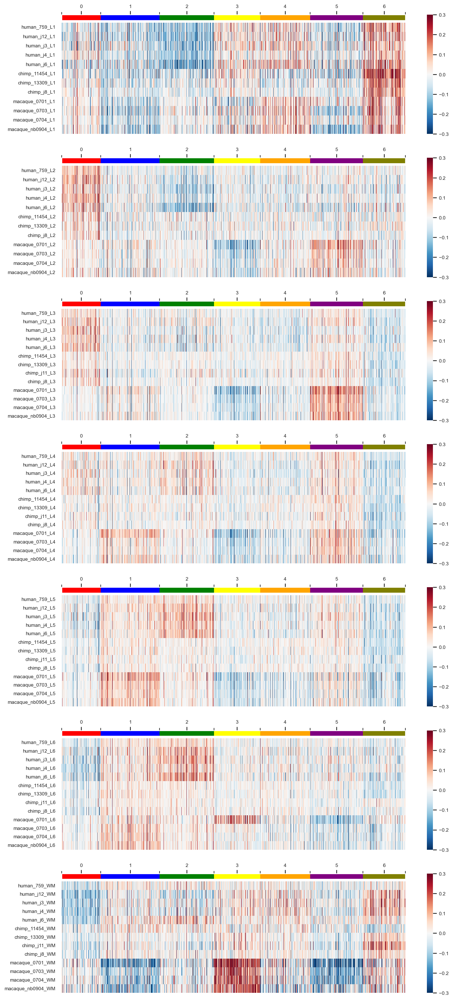

In [37]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

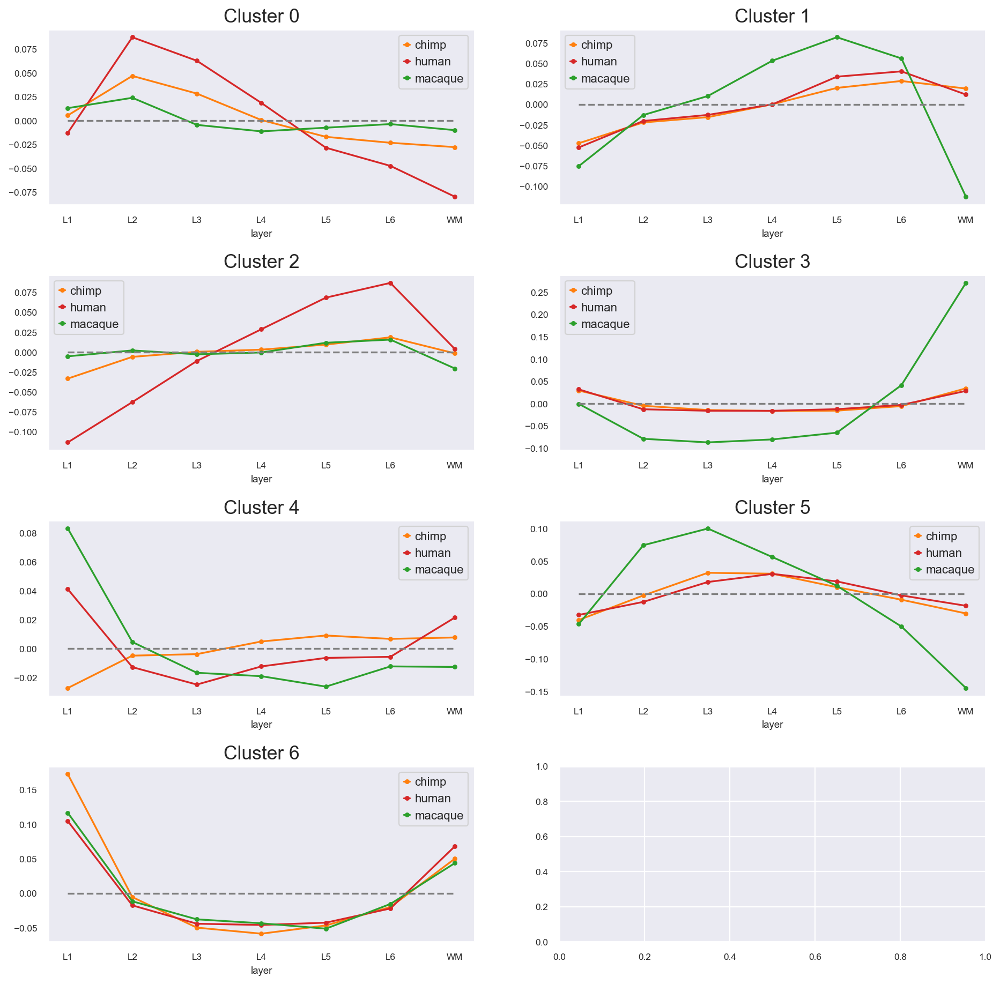

In [38]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 8 clusters

#### Clustering

In [39]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 8
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, random_state=4)

In [40]:
cl_order = {i: a for i, a in enumerate([7, 5, 2, 4, 1, 0, 6, 3])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv')

#### Heatmap

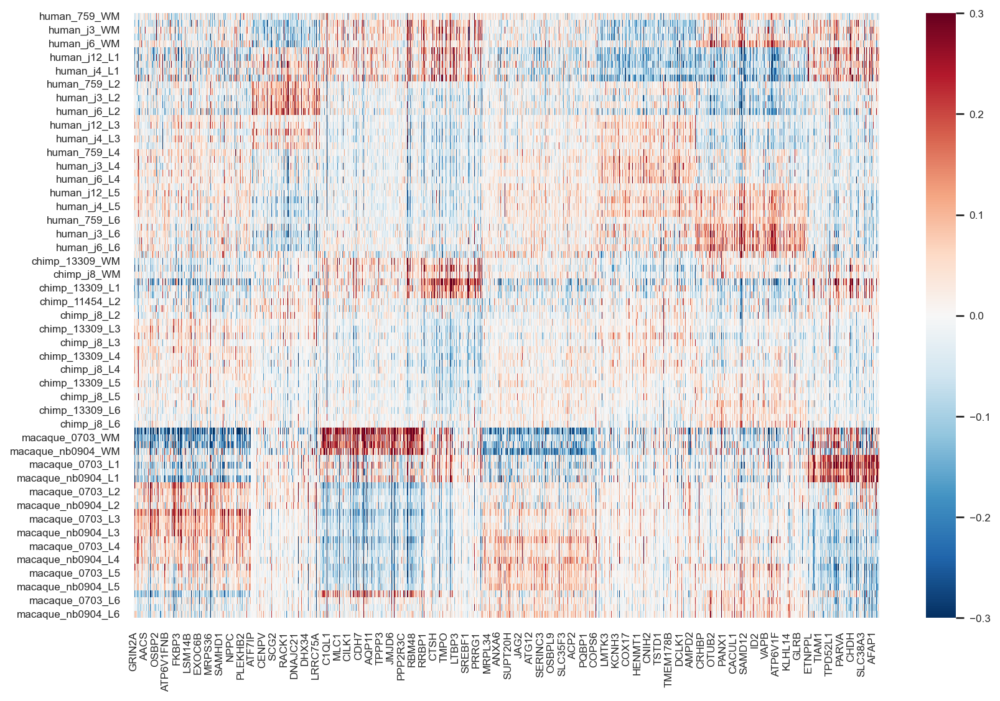

In [41]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

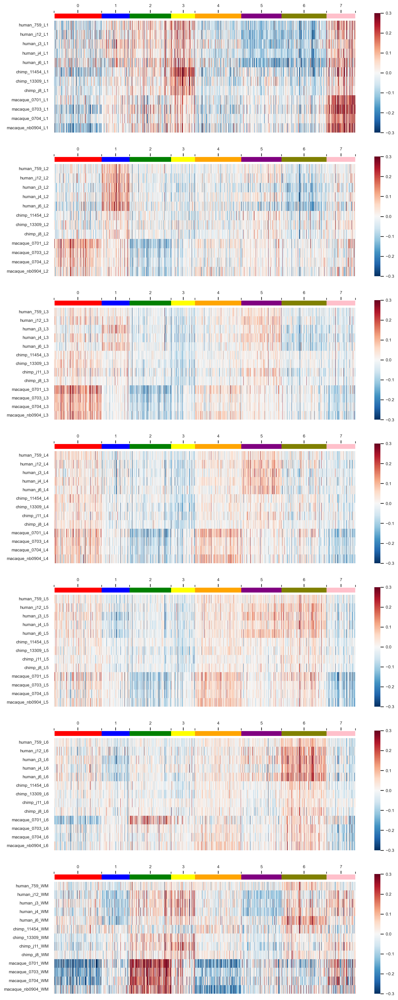

In [42]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

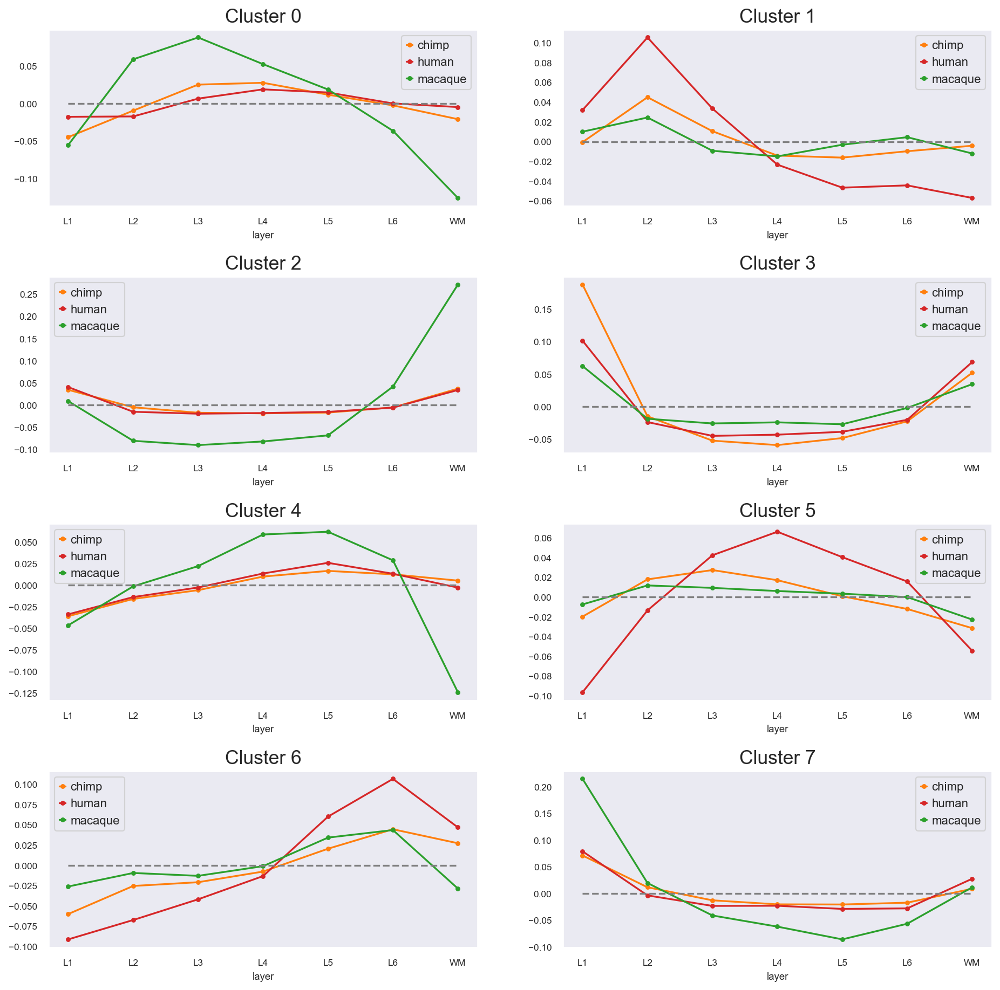

In [43]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')

### 9 clusters

#### Clustering

In [44]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import pairwise_kernels
aff_matrix = pairwise_kernels(df.T, metric='cosine') + 1
n_clusters = 9
clustering = SpectralClustering(n_clusters=n_clusters, gamma=1, affinity='precomputed', random_state=4)
clustering.fit(aff_matrix)

SpectralClustering(affinity='precomputed', gamma=1, n_clusters=9,
                   random_state=4)

In [45]:
cl_order = {i: a for i, a in enumerate([3, 5, 8, 0, 2, 6, 1, 7, 4])}
labels = pd.Series(clustering.labels_, index=df.columns).map(cl_order).sort_values()
order = labels.sort_values().index
labels.to_csv(de_dir_path + f'cluster_spectr_anova_mean_{n_clusters}.csv')

#### Heatmap

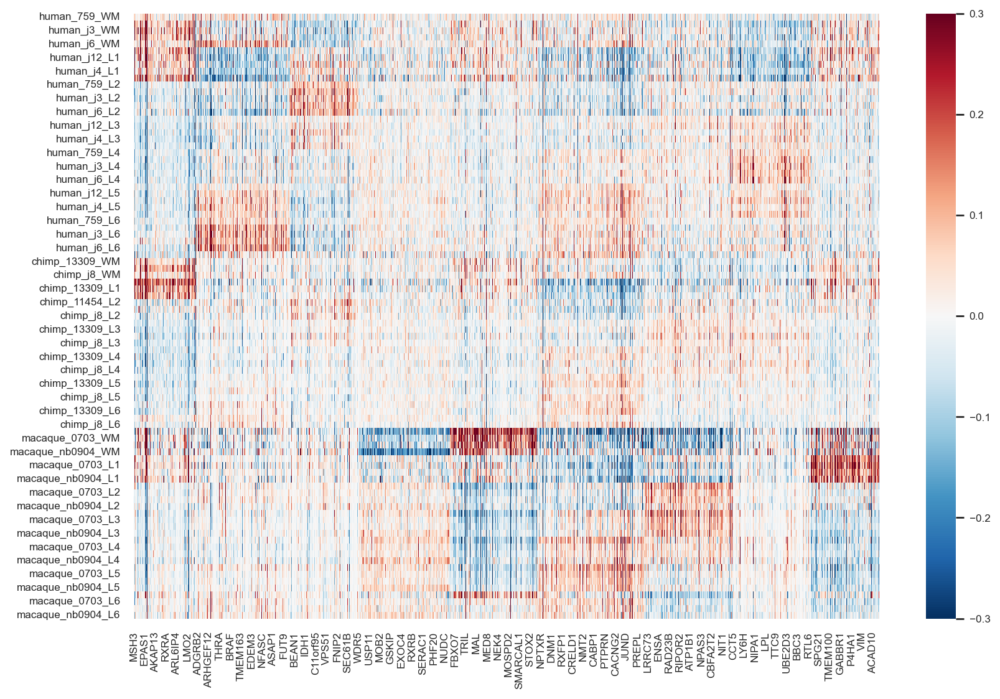

In [46]:
sns.set(font_scale=0.7)
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(df.loc[sample_order['all'], order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0)
plt.savefig(f'figures/heatmaps/heatmap_spectr{n_clusters}_anova.png', bbox_inches='tight')

#### Heatmap for each layer

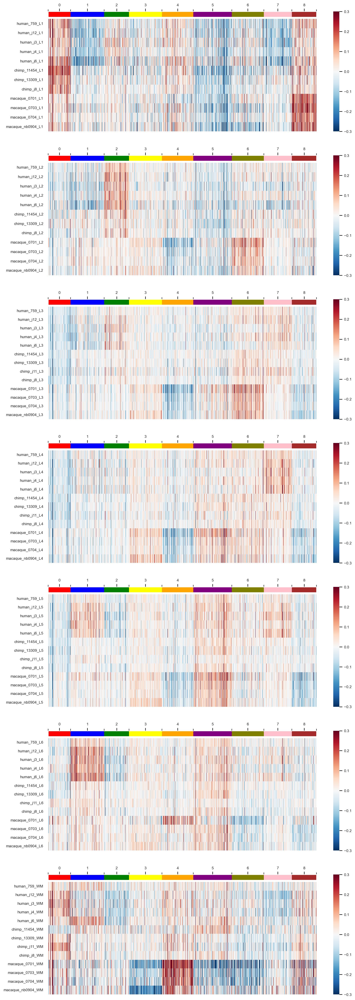

In [47]:
from matplotlib.patches import bbox_artist
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import ticker

clusters = np.arange(n_clusters)
colors = cluster_color[:n_clusters]
fig, axes = plt.subplots(7, 1, figsize=(12, 4 * n_clusters), gridspec_kw={'hspace': 0.2})

for ax, layer in zip(axes.flatten(), layers):
    df_layer = df.loc[df.index.str.contains(layer)]
    sns.heatmap(df_layer.loc[:, order], ax=ax, cmap="RdBu_r", vmax=0.3, vmin=-0.3, center=0, xticklabels=False)
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('top', size='5%', pad=0.05)
    cmap = mpl.colors.ListedColormap(colors)

    cluster_size = labels.value_counts().loc[clusters].values
    cluster_pos = cluster_size.cumsum()
    bounds = [0] + list(cluster_pos)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    fig.colorbar(
        mpl.cm.ScalarMappable(cmap=cmap, norm=norm),
        cax=cax,
        ticks=bounds,
        orientation='horizontal',
        spacing='proportional'
    )
    cax.xaxis.set_major_locator(ticker.FixedLocator(cluster_pos - cluster_size / 2))
    cax.xaxis.set_major_formatter(ticker.FixedFormatter(clusters))
    cax.xaxis.tick_top()

#### Snakeplot for each layer

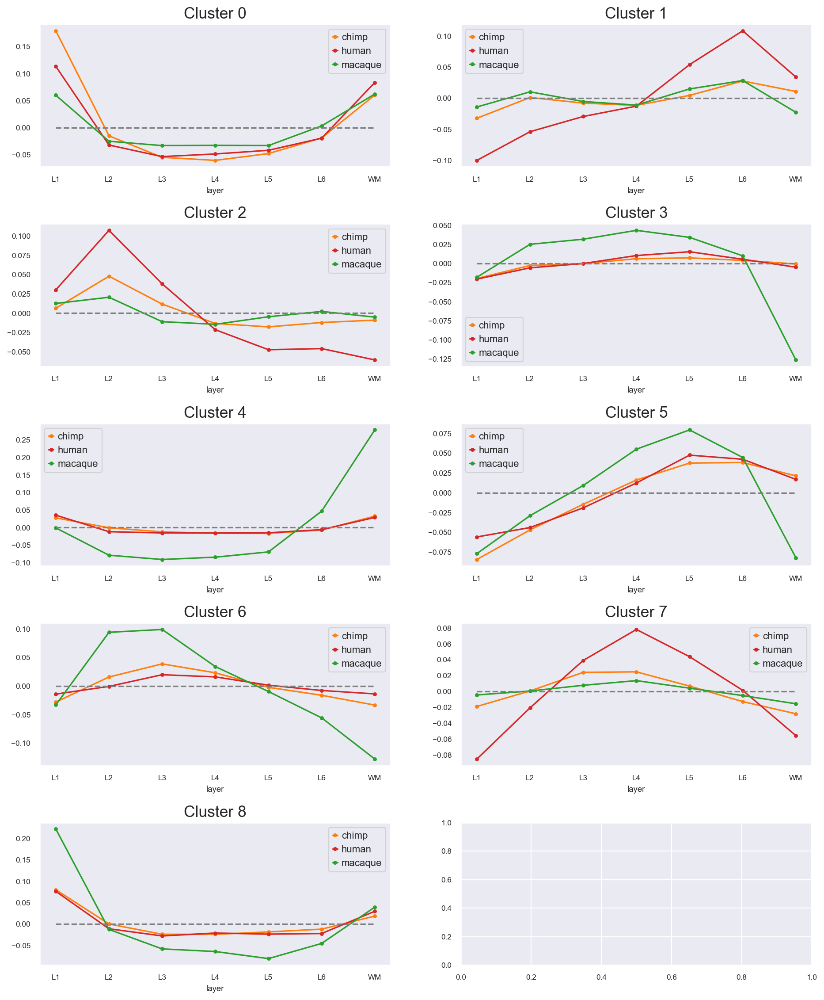

In [48]:
n_rows = (n_clusters // 2 + n_clusters % 2)
fig, axes = plt.subplots(n_rows, 2,  figsize=(14, 3.5 * n_rows), gridspec_kw={'hspace': 0.4})

for label, ax in zip(clusters, axes.flatten()):
    genes = labels[labels == label].index.tolist()

    (
        layer_mean[genes]
        .mean(axis=1)
        .reorder_levels(['layer', 'condition'])
        .unstack().loc[layers]
        .plot
        .line(color={'human': 'tab:red', 'chimp': 'tab:orange', 'macaque': 'tab:green'}, ax=ax, marker='.')
    )
    ax.legend(fontsize=10)
    ax.set_title(f'Cluster {label}', fontsize=16)
    ax.grid(False)
    ax.hlines(0, xmin=0, xmax=6, colors='gray', linestyles='dashed')
plt.savefig(f'figures/snakeplots/snakeplot_layers_mean_only_clusters{n_clusters}.png', bbox_inches='tight')